# **Trading Bot Python Project**

**Done By: 
        - Labriji Saad
        - Isbaine Mohamed**

## **First Thing: An Overview**

**As part of our studies of the Python for Data Science, we are led to carry out this project which aims to create a trading bot under python. The ultimate goal is to achieve maximum gain over a given period (year 2021 for example).**



## **Second Thing: Used Dataset**

**In this project, we are going to use btc-usd history of 2020 for models training and those of 2021 for testing our models.**

> Let's get our data:

*The Binance API is a method that allows you to connect to the Binance servers via Python or several other programming languages. With it, you can automate your trading.*

*More specifically, Binance has a RESTful API that uses HTTP requests to send and receive data. Further, there is also a WebSocket available that enables the streaming of data such as price quotes and account updates.*

**We will request historical Bitcoin price data from the Binance API and then outline four options to save that data to a CSV file**.

**We want data that goes as far back as possible. Fortunately, there is a function within the library that allows us to determine the first available price point.**

**To access the Binance API, we need to create an account there.**

YqPusxCep23n2iA

In [1]:
# necessary imports
import pandas as pd
import math
import os.path
import time
!pip install python-binance
from binance.client import Client  # if you got an error while importing binance please try to install/upgrade python-binance package using python -m pip install python-binance
from datetime import timedelta, datetime
from dateutil import parser
from tqdm import tqdm_notebook #(Optional, used for progress-bars)
import numpy as np

     |████████████████████████████████| 63 kB 1.3 MB/s             
     |████████████████████████████████| 103 kB 9.2 MB/s            
     |████████████████████████████████| 288 kB 64.7 MB/s            
  Attempting uninstall: websockets
    Found existing installation: websockets 10.1
    Uninstalling websockets-10.1:
      Successfully uninstalled websockets-10.1


In [2]:
# Access the Binance API
binance_api_key = 'yeTZrOlZHpLEognBPVV10jONF I a9ISZaH76D3sk3L80dv3dYMg3Qebo7kgG6GWUq'    #Enter your own API-key here
binance_api_secret = 'GrZqOqKV7qc3wnykaS7MFiHZ3PmSf4bwRmhnozAdOZdkyHxbwjYZnwmCA)FmUpf' #Enter your own API-secret here

In [3]:
# Constants
binsizes = {"1m": 1, "5m": 5, "1h": 60, "1d": 1440}
batch_size = 200
binance_client = Client(api_key=binance_api_key, api_secret=binance_api_secret)

In [4]:
# fetch 1 hour data from 2020 until 2022

data_df=pd.DataFrame()
filename="BTC-USDT.csv"
klines = binance_client.get_historical_klines("BTCUSDT", "1h", "2020-01-01 00:00:00", "2022-01-01 00:00:00")
data = pd.DataFrame(klines, columns = ['timestamp', 'open', 'high', 'low', 'close', 'volume', 'close_time', 'quote_av', 'trades', 'tb_base_av', 'tb_quote_av', 'ignore' ])
data['timestamp'] = pd.to_datetime(data['timestamp'], unit='ms')
data['close_time'] = pd.to_datetime(data['timestamp'], unit='ms')
data.set_index('timestamp', inplace=True)
data.to_csv(filename)
print('Our data is saved into csv file at Working directory')



Our data is saved into csv file at Working directory


Now our data is here!
## **Third Thing: Explore data**

In [5]:
# let's read our generated file

df=pd.read_csv("./BTC-USDT.csv")

print(df.columns)



df.tail(5)


Index(['timestamp', 'open', 'high', 'low', 'close', 'volume', 'close_time',
       'quote_av', 'trades', 'tb_base_av', 'tb_quote_av', 'ignore'],
      dtype='object')


,timestamp,open,high,low,close,volume,close_time,quote_av,trades,tb_base_av,tb_quote_av,ignore
17510,2021-12-31 20:00:00,45728.28,46211.07,45678.00,45879.24,1831.41202,2021-12-31 20:00:00,8.422142e+07,51300,997.72369,4.588270e+07,0
17511,2021-12-31 21:00:00,45886.66,46513.67,45766.85,46333.86,1734.69585,2021-12-31 21:00:00,7.997065e+07,54579,972.44065,4.482430e+07,0
17512,2021-12-31 22:00:00,46333.87,46569.97,46232.36,46303.99,991.85142,2021-12-31 22:00:00,4.600406e+07,36280,447.96605,2.077702e+07,0
17513,2021-12-31 23:00:00,46303.98,46520.13,46132.04,46216.93,985.99762,2021-12-31 23:00:00,4.571976e+07,29555,484.09229,2.244919e+07,0
17514,2022-01-01 00:00:00,46216.93,46731.39,46208.37,46656.13,1503.33095,2022-01-01 00:00:00,6.987999e+07,38608,806.06536,3.746216e+07,0


**as we can see, our data is completely downloaded ( last timestamp is 2022-01-01 00:00:00 )**

In [6]:
# Let's discover more about our data using info(), shape, describe() methods

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17515 entries, 0 to 17514
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   timestamp    17515 non-null  object 
 1   open         17515 non-null  float64
 2   high         17515 non-null  float64
 3   low          17515 non-null  float64
 4   close        17515 non-null  float64
 5   volume       17515 non-null  float64
 6   close_time   17515 non-null  object 
 7   quote_av     17515 non-null  float64
 8   trades       17515 non-null  int64  
 9   tb_base_av   17515 non-null  float64
 10  tb_quote_av  17515 non-null  float64
 11  ignore       17515 non-null  int64  
dtypes: float64(8), int64(2), object(2)
memory usage: 1.6+ MB


*- First thing we can see: There's no missing values.*

> *let's check it :*



In [8]:
print(f"the number of missing values is :\n{df.isna().sum()}")

the number of missing values is :
timestamp      0
open           0
high           0
low            0
close          0
volume         0
close_time     0
quote_av       0
trades         0
tb_base_av     0
tb_quote_av    0
ignore         0
dtype: int64


*- Second thing: all features are ints or floats except dates which are strings*

> so Let's covert them to datetime types


In [9]:

df['timestamp'] =  pd.to_datetime(df['timestamp'])
df['close_time'] =  pd.to_datetime(df['close_time'])
## Setting the index

df.set_index("timestamp", inplace=True)

In [10]:
# check our changes
df.dtypes

open                  float64
high                  float64
low                   float64
close                 float64
volume                float64
close_time     datetime64[ns]
quote_av              float64
trades                  int64
tb_base_av            float64
tb_quote_av           float64
ignore                  int64
dtype: object

everything is fine

In [11]:
# Describe our data:
df.describe()

,open,high,low,close,volume,quote_av,trades,tb_base_av,tb_quote_av,ignore
count,17515.000000,17515.000000,17515.000000,17515.000000,17515.000000,1.751500e+04,17515.000000,17515.000000,1.751500e+04,17515.0
mean,29191.798961,29366.124512,29004.835042,29194.051257,2926.314184,8.226681e+07,56248.641222,1432.986751,4.043844e+07,0.0
std,19657.797498,19776.204558,19532.091485,19657.539124,2578.018701,8.944930e+07,43098.696105,1266.198239,4.409161e+07,0.0
min,4131.230000,4610.000000,3782.130000,4130.640000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.0
25%,9692.270000,9726.435000,9653.655000,9692.600000,1482.499970,2.188977e+07,27239.500000,719.546170,1.062644e+07,0.0
50%,28926.320000,29125.320000,28738.100000,28966.360000,2208.244252,5.628501e+07,45218.000000,1073.394230,2.742603e+07,0.0
75%,47889.355000,48142.485000,47608.730000,47889.035000,3437.286985,1.112008e+08,72817.500000,1696.188487,5.480834e+07,0.0
max,68635.120000,69000.000000,68451.190000,68633.690000,47255.762685,1.514465e+09,799206.000000,20628.794047,6.849674e+08,0.0


NB: we can see that the distributions of open , high and low prices are very similar based on min, max, mean and  std

## **Data Visualization**

In [12]:
### Let' import necessary libraries

import seaborn as sb
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as py
import matplotlib.pyplot as plt

1. Let's visualize the open price feature

In [13]:
config={'text': 'visualization of price Value'}
open = go.Figure(data=[go.Scatter(x=df.index, y=df['open'], name= 'Open Price')])

open.update_layout(title = config , template="plotly_dark") ##Available templates:['ggplot2', 'seaborn', 'simple_white', 'plotly','plotly_white', 'plotly_dark', 'presentation', 'xgridoff','ygridoff', 'gridon', 'none']

open.show()

- Let's plot the candlestick plot 

In [14]:
### Plotting the candlestick
fig = go.Figure(data=[go.Candlestick(
    x=df.index,
    open=df['open'], high=df['high'],
    low=df['low'], close=df['close'],
    increasing_line_color= 'blue', decreasing_line_color= 'orange'
)])

fig.show()

**- Let's take a see on the correlation between features**

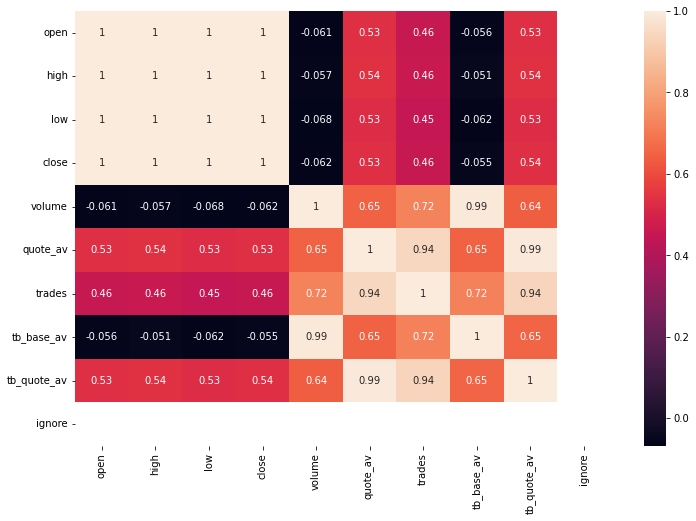

In [15]:
## the correlation matrix 
corr = df.corr()
plt.figure(figsize=(12, 8))
sb.heatmap(corr,annot=True)

plt.show()

we can see that the trades and tb_quote_av are highly correlated
the sale for quote_av and tb_quote_av.

## *Preprocessing data*

Now let's split our data int train data and test data

In [16]:
df.head()

,open,high,low,close,volume,close_time,quote_av,trades,tb_base_av,tb_quote_av,ignore
timestamp,,,,,,,,,,,
2020-01-01 00:00:00,7195.24,7196.25,7175.46,7177.02,511.814901,2020-01-01 00:00:00,3.675857e+06,7640,226.153126,1.624289e+06,0
2020-01-01 01:00:00,7176.47,7230.00,7175.71,7216.27,883.052603,2020-01-01 01:00:00,6.365953e+06,9033,570.721419,4.114804e+06,0
2020-01-01 02:00:00,7215.52,7244.87,7211.41,7242.85,655.156809,2020-01-01 02:00:00,4.736719e+06,7466,357.180263,2.582514e+06,0
2020-01-01 03:00:00,7242.66,7245.00,7220.00,7225.01,783.724867,2020-01-01 03:00:00,5.667367e+06,8337,394.810811,2.854987e+06,0
2020-01-01 04:00:00,7225.00,7230.00,7215.03,7217.27,467.812578,2020-01-01 04:00:00,3.379094e+06,5896,243.514706,1.759053e+06,0


In [17]:
# splitting data:
close_price = df['close']
print("Forme du dataframe close", close_price.shape)

Forme du dataframe close (17515,)


In [18]:
close_price.head()

timestamp
2020-01-01 00:00:00    7177.02
2020-01-01 01:00:00    7216.27
2020-01-01 02:00:00    7242.85
2020-01-01 03:00:00    7225.01
2020-01-01 04:00:00    7217.27
Name: close, dtype: float64

In ordoer to split data, we are going to take into consideration just te close price as targetvariable. and the features will be the previous values of the same variable


In [19]:
# First, we are going to split our data into train and test: (75% for train and 25% for test)
#train_data=close_price[0:int(len(df["close"])*0.75),:]
#test_data=close_price[int(len(df["close"])*0.75):,:]
#train_data=close_price.iloc[0:int(len(df["close"])*0.75),:]
train_data=df[0:int(len(df["close"])*0.75)]
test_data=df[int(len(df["close"])*0.75):]

In [20]:
print("the shape of train data is {}".format(train_data.shape))
print("the shape of test data is {}".format(test_data.shape))

the shape of train data is (13136, 11)
the shape of test data is (4379, 11)


Now it's time to select only the close_price feature

In [21]:
close_train=train_data['close']
close_test=test_data['close']

In [22]:
# Before moving on, we need to normalize our data to have good models
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,1))
close_train=np.array(scaler.fit_transform(np.array(close_train).reshape(-1,1)))
close_test=np.array(scaler.fit_transform(np.array(close_test).reshape(-1,1)))


In [23]:
## checking if the values were scaled successfully
close_train[0]

array([0.05039786])

In [24]:
def Vect(train,test,timestamp):
    X_train,X_test=np.zeros((len(train)-timestamp,timestamp)),np.zeros((len(test)-timestamp,timestamp))
    y_train,y_test=np.array(train[timestamp:]),np.array(test[timestamp:]) #The first element will need the 'timestamp' previous values
     # loop through the train data:
    for i in range(timestamp,len(train)):
        Xtrain=train[i-timestamp:i]
        if len(Xtrain)==timestamp:
            X_train[i-timestamp,:] = np.array(Xtrain).reshape((timestamp,))
    for i in range(timestamp,len(test)):
        Xtest=test[i-timestamp:i]
        if len(Xtest)==timestamp:
            X_test[i-timestamp,:] = np.array(Xtest).reshape((timestamp,))
    return X_train,X_test,y_train,y_test
    
    


In [25]:
timestamp=10
X_train,X_test,y_train,y_test=Vect(close_train,close_test,10)

In [26]:
X_test.shape
#_test.shape

(4369, 10)

Now let's construxt our X_train, X_test and y_train and y_test


In [27]:
print("the shape of X_train is {0}, {1}".format(len(X_train),len(X_train[0])))
print("the shape of y_train is {0}".format(y_train.shape))
print("the shape of X_test is {0}, {1}".format(len(X_test),len(X_test[0])))
print("the shape of y_test is {0}".format(y_test.shape))

the shape of X_train is 13126, 10
the shape of y_train is (13126, 1)
the shape of X_test is 4369, 10
the shape of y_test is (4369, 1)


Our data is ready

## **Models construction**

In this section, we are going to build our models:
we are going to use Linear Regressor, XGBRegressor,RandomForestRegressor,SGDRegressor,RidgeRegressor,Lassoregressor,SVR(linear kernel)

In [28]:
#necessary imports:
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.svm import LinearSVR


> **Let's instanciate our models:**

In [29]:

# Initalizing the Linear model:
LinReg = LinearRegression()

# Initalizing the SGBR model:
    ## You can specify hyperparameter values to the class constructor to configure the model.

    ## Perhaps the most commonly configured hyperparameters are the following:

    #    n_estimators: The number of trees in the ensemble, often increased until no further improvements are seen.
    #   max_depth: The maximum depth of each tree, often values are between 1 and 10.
    #   eta: The learning rate used to weight each model, often set to small values such as 0.3, 0.1, 0.01, or smaller.
    #   subsample: The number of samples (rows) used in each tree, set to a value between 0 and 1, often 1.0 to use all samples.
    #   colsample_bytree: Number of features (columns) used in each tree, set to a value between 0 and 1, often 1.0 to use all features.

XGBR = XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

#Initializing the RandomForestRegressor

RandomForest = RandomForestRegressor(max_depth=1000)

#Initializing the SDGRegressor

SGDreg=SGDRegressor(max_iter=1000, tol=1e-3)

# Initializing the Ridge
ridgereg = Ridge()

# Initializin the Lasso
lassoreg=Lasso(max_iter=10000)

# Initializing the Linea SVR


SVRreg=LinearSVR(random_state=0, tol=1e-5)

#in order to simlify the task we are going to create a dictionnary to map each model to a name

models = {"Linear Regression":LinReg, "XGBoost Regressor":XGBR, "Random Forest Regressor":RandomForest,"SGD Regressor":SGDreg,"Ridge Regressor":ridgereg,"Lasso regressor":lassoreg,"SVR":SVRreg}


In [30]:
X_train[0:10]
XTRAIN=np.array([np.array(xi) for xi in X_train])
XTRAIN.ndim
XTRAIN.reshape(-1, XTRAIN.shape[-1])
XTRAIN.shape

(13126, 10)

In [31]:
training=train_data.copy()
testing=test_data.copy()
training.drop(training.columns.difference(['close']), 1, inplace=True)
training["scaled_close"]=scaler.fit_transform(training)
training = training.iloc[timestamp: , :]
testing.drop(testing.columns.difference(['close']), 1, inplace=True)
testing["scaled_close"]=scaler.fit_transform(testing)
testing = testing.iloc[timestamp: , :]
#prediction=pd.DataFrame()
#prediction=[pd.DataFrame(),pd.DataFrame(test_data.iloc[timestamp:,3])]
#type(train_data.iloc[timestamp:,3])
print("shape of train:",training.shape)
print("shape of test:",testing.shape)
prediction=[training,testing]
prediction=pd.concat(prediction)
print("shape of join:",prediction.shape)
#prediction=scaler.fit_transform(prediction)
#prediction["scaled_close"]=scaler.fit_transform(prediction)

shape of train: (13126, 2)
shape of test: (4369, 2)
shape of join: (17495, 2)


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



In [32]:
prediction.head()

,close,scaled_close
timestamp,,
2020-01-01 10:00:00,7202.00,0.050811
2020-01-01 11:00:00,7197.20,0.050732
2020-01-01 12:00:00,7225.59,0.051201
2020-01-01 13:00:00,7221.20,0.051129
2020-01-01 14:00:00,7221.43,0.051133


In [33]:
prediction.tail()

,close,scaled_close
timestamp,,
2021-12-31 20:00:00,45879.24,0.419725
2021-12-31 21:00:00,46333.86,0.431318
2021-12-31 22:00:00,46303.99,0.430556
2021-12-31 23:00:00,46216.93,0.428336
2022-01-01 00:00:00,46656.13,0.439537


In [34]:
# Let's create a function that train all the models above
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
def training(model):
    models[model].fit(X_train,y_train)
    y_pred_test = models[model].predict(X_test)
    y_pred_train = models[model].predict(X_train)
    prediction[model]=np.concatenate((y_pred_train,y_pred_test), axis=0)
    print("\n---------------"+model+"---------------\n")
    print("Mean Absolute Error - MAE : " + str(mean_absolute_error(y_test, y_pred_test)))
    print("Root Mean squared Error - RMSE : " + str(math.sqrt(mean_squared_error(y_test, y_pred_test)))+"\n")
    return (mean_absolute_error(y_test, y_pred_test),math.sqrt(mean_squared_error(y_test, y_pred_test)))

In [35]:
# Now we are going to train the models:
i=1
MSE=[]
MAE=[]
for model in models:
    
    print(i)
    metrics=training(model)
    MSE.append(metrics[1])
    MAE.append(metrics[0])
    i=i+1
results=[MSE,MAE]
models_results=pd.DataFrame(results,columns=models.keys(),index =['MSE','MAE'])

1

---------------Linear Regression---------------

Mean Absolute Error - MAE : 0.005887737949972745
Root Mean squared Error - RMSE : 0.008600611030823758

2

---------------XGBoost Regressor---------------

Mean Absolute Error - MAE : 0.007314965092762749
Root Mean squared Error - RMSE : 0.010450975762840936

3


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().




---------------Random Forest Regressor---------------

Mean Absolute Error - MAE : 0.006987949316743683
Root Mean squared Error - RMSE : 0.01003483206888452

4

---------------SGD Regressor---------------

Mean Absolute Error - MAE : 0.011796751614101295
Root Mean squared Error - RMSE : 0.016998545586159056

5

---------------Ridge Regressor---------------

Mean Absolute Error - MAE : 0.007439971924113474
Root Mean squared Error - RMSE : 0.010975348353931658

6

---------------Lasso regressor---------------

Mean Absolute Error - MAE : 0.25588879713696394
Root Mean squared Error - RMSE : 0.30654844177061913

7


/opt/conda/lib/python3.7/site-packages/sklearn/utils/validation.py:72: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/opt/conda/lib/python3.7/site-packages/sklearn/utils/validation.py:72: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




---------------SVR---------------

Mean Absolute Error - MAE : 0.0059428880214549736
Root Mean squared Error - RMSE : 0.008714573771368249



/opt/conda/lib/python3.7/site-packages/sklearn/svm/_base.py:977: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



In [36]:
prediction.head()

,close,scaled_close,Linear Regression,XGBoost Regressor,Random Forest Regressor,SGD Regressor,Ridge Regressor,Lasso regressor,SVR
timestamp,,,,,,,,,
2020-01-01 10:00:00,7202.00,0.050811,0.050670,0.050593,0.050690,0.051217,0.050988,0.305626,0.050581
2020-01-01 11:00:00,7197.20,0.050732,0.050891,0.050551,0.050826,0.051257,0.050992,0.305626,0.050778
2020-01-01 12:00:00,7225.59,0.051201,0.050802,0.050654,0.050927,0.051225,0.050959,0.305626,0.050699
2020-01-01 13:00:00,7221.20,0.051129,0.051277,0.050844,0.051250,0.051199,0.051122,0.305626,0.051136
2020-01-01 14:00:00,7221.43,0.051133,0.051174,0.050896,0.051203,0.051194,0.051187,0.305626,0.051058


In [37]:
for model in models.keys():
    fig = px.line(prediction,x=prediction.index, y=[prediction['scaled_close'],prediction[model]],
                  labels={'value':'Close price','date': 'Date'})
    fig.update_layout(title_text='Prediction avec le '+model,
                      plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
    fig.show()

As we can see, the Linear Regression is the best model for the moment.

## **Time Series Analysis:**

**In this section, we are going to deal with our data as a time series.**

In [38]:
# get our data
data=pd.read_csv("./BTC-USDT.csv")
data['timestamp'] =  pd.to_datetime(data['timestamp'])
data['close_time'] =  pd.to_datetime(data['close_time'])
##Setting the index

data.set_index("timestamp", inplace=True)
data.head()

,open,high,low,close,volume,close_time,quote_av,trades,tb_base_av,tb_quote_av,ignore
timestamp,,,,,,,,,,,
2020-01-01 00:00:00,7195.24,7196.25,7175.46,7177.02,511.814901,2020-01-01 00:00:00,3.675857e+06,7640,226.153126,1.624289e+06,0
2020-01-01 01:00:00,7176.47,7230.00,7175.71,7216.27,883.052603,2020-01-01 01:00:00,6.365953e+06,9033,570.721419,4.114804e+06,0
2020-01-01 02:00:00,7215.52,7244.87,7211.41,7242.85,655.156809,2020-01-01 02:00:00,4.736719e+06,7466,357.180263,2.582514e+06,0
2020-01-01 03:00:00,7242.66,7245.00,7220.00,7225.01,783.724867,2020-01-01 03:00:00,5.667367e+06,8337,394.810811,2.854987e+06,0
2020-01-01 04:00:00,7225.00,7230.00,7215.03,7217.27,467.812578,2020-01-01 04:00:00,3.379094e+06,5896,243.514706,1.759053e+06,0


In [39]:
# Extract our close values

data=data['close']
data.index

DatetimeIndex(['2020-01-01 00:00:00', '2020-01-01 01:00:00',
               '2020-01-01 02:00:00', '2020-01-01 03:00:00',
               '2020-01-01 04:00:00', '2020-01-01 05:00:00',
               '2020-01-01 06:00:00', '2020-01-01 07:00:00',
               '2020-01-01 08:00:00', '2020-01-01 09:00:00',
               ...
               '2021-12-31 15:00:00', '2021-12-31 16:00:00',
               '2021-12-31 17:00:00', '2021-12-31 18:00:00',
               '2021-12-31 19:00:00', '2021-12-31 20:00:00',
               '2021-12-31 21:00:00', '2021-12-31 22:00:00',
               '2021-12-31 23:00:00', '2022-01-01 00:00:00'],
              dtype='datetime64[ns]', name='timestamp', length=17515, freq=None)

<AxesSubplot:xlabel='timestamp'>

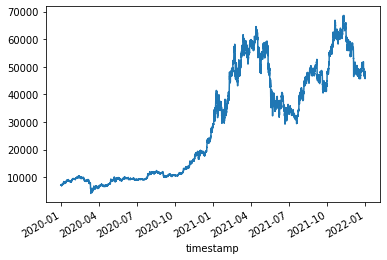

In [40]:
# Let's plot our data:
data.plot()

**- Times Series Decomposition;**

In [41]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose

In [42]:
data.columns=['close']

In [43]:
data.head()

timestamp
2020-01-01 00:00:00    7177.02
2020-01-01 01:00:00    7216.27
2020-01-01 02:00:00    7242.85
2020-01-01 03:00:00    7225.01
2020-01-01 04:00:00    7217.27
Name: close, dtype: float64

In [44]:
result=seasonal_decompose(data.values, model='multiplicative', period=10)

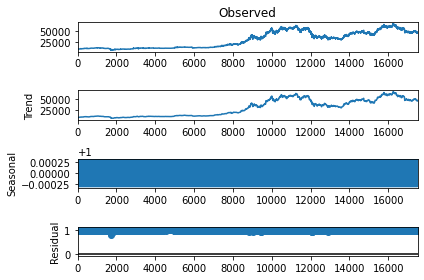

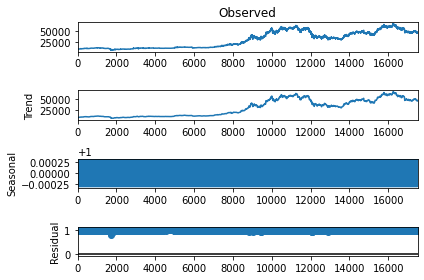

In [45]:
result.plot()

## **Checks for Stationarity**

There are many methods to check whether a time series (direct observations, residuals, otherwise) is stationary or non-stationary.

    - Look at Plots: You can review a time series plot of your data and visually check if there are any obvious trends or seasonality.
     - Summary Statistics: You can review the summary statistics for your data for seasons or random partitions and check for obvious or significant differences.
     - Statistical Tests: You can use statistical tests to check if the expectations of stationarity are met or have been violated.


In [46]:
from statsmodels.tsa.stattools import adfuller
log_df = np.log(data)
X = log_df.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.077430
p-value: 0.723988
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


> **the p-value is greater than 0.05, which means that the test have failed to reject the null hypothesis (H0), the data has a unit root and is non-stationary.**

> **From the above, we can conclude that the data is non-stationary. Hence, we would need to use the “Integrated (I)” concept, denoted by value ‘d’ in time series to make the data stationary while building the Auto ARIMA model.**

So let's make our ensure stationarity!

Text(0.5, 1.0, '2nd differenciation')

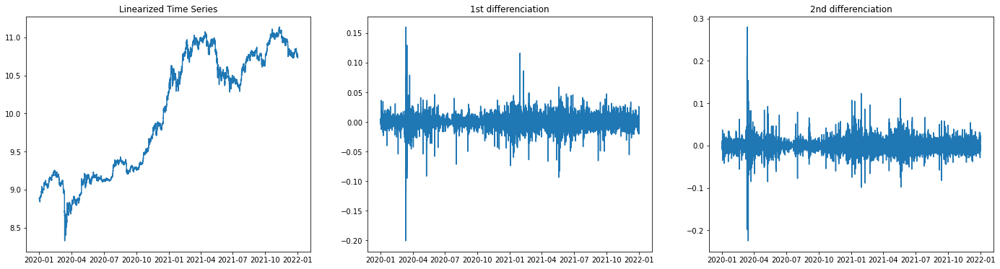

In [47]:

fig, axes = plt.subplots(1, 3,figsize=(24,6))

plt.style.use('seaborn-deep')

axes[0].plot(log_df);
axes[0].set_title('Linearized Time Series')
             
y_diff = log_df.diff().dropna()
axes[1].plot(y_diff);
axes[1].set_title('1st differenciation')


y_diff_diff = log_df.diff().diff().dropna()
axes[2].plot(y_diff_diff);
axes[2].set_title('2nd differenciation')

In [48]:
#Let's verify the stationarity again

y_diff= log_df.diff().dropna()
y_diff2= log_df.diff().diff().dropna()

print('p-value linearized series: ', adfuller(log_df)[1])
print('p-value first-diff: ', adfuller(y_diff)[1])
print('p-value second-diff: ', adfuller(y_diff2)[1])


p-value linearized series:  0.7239882689165069
p-value first-diff:  0.0
p-value second-diff:  0.0


We got stationarity now!

## **Forecasting**

An important part of model building is splitting our data for training and testing, which ensures that you build a model that can generalize outside of the training data and that the performance and outputs are statistically meaningful. 

We will split our data such that everything before December October 31th 2020 will serve as training data, with everything after this date becoming the testing data:

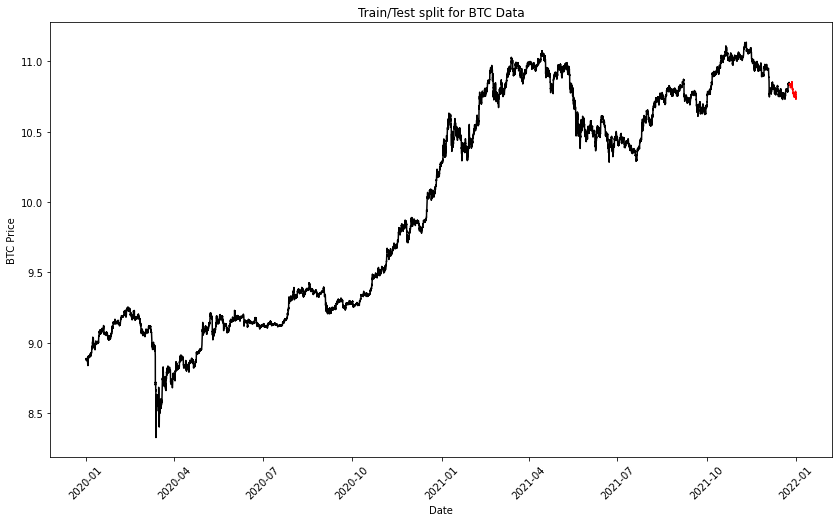

In [49]:
train_test_split_date="2021-12-25"
train = log_df[log_df.index <= pd.to_datetime(train_test_split_date, format='%Y-%m-%d')]
test = log_df[log_df.index > pd.to_datetime(train_test_split_date, format='%Y-%m-%d')]
plt.subplots(figsize=(14,8))
plt.plot(train, color = "black")
plt.plot(test, color = "red")
plt.ylabel('BTC Price')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.title("Train/Test split for BTC Data")
plt.show()

## **1. Autoregressive Moving Average (ARMA)**

> **Moving average refers to the predictions being represented by a weighted, linear combination of white noise terms, where white noise is a random signal. The idea here is that ARMA uses a combination of past values and white noise in order to predict future values. Autoregression models market participant behavior like buying and selling BTC. The white noise models shock events like wars, recessions and political events.**

In [50]:
# We can define an ARMA model using the SARIMAX package:
from statsmodels.tsa.statespace.sarimax import SARIMAX

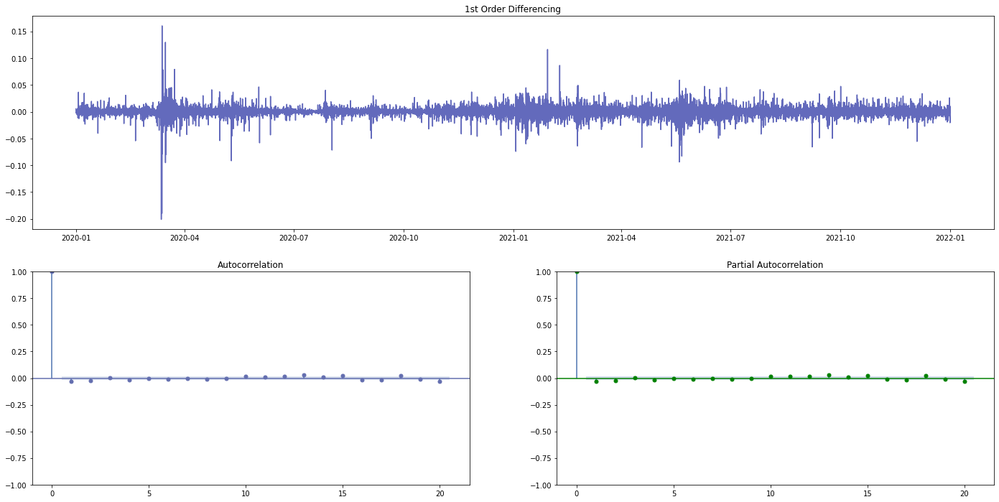

In [51]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

#figure setup
fig = plt.figure(figsize=(24,12))
ax1 = fig.add_subplot(2,1,1)
ax1.set_title('1st Order Differencing')
ax2 = fig.add_subplot(2,2,3)
ax3 = fig.add_subplot(2,2,4)

#plots
ax1.plot(y_diff, color="#636ABC")
plot_acf(y_diff, lags=20, ax=ax2, color="#636EAF");
plot_pacf(y_diff, lags=20, ax=ax3, color='green', method='ywm')
plt.show()

As we can see, the value of p and q can be determined by analyzing the acf and pacf plots:
in our case: p=1 and q=1

Auto ARIMA:

For a while, we have been going through the process of manually fitting different models and deciding which one is best. So, we are going to automate the process. Basically, it takes the data and fits many models in a different order before comparing the characteristics. However, the processing time increases substantially, when we try to fit complex models.

How does it work:

In Time Series Analysis, a correct model should yield the highest Log-Likelihood and requires the lowest AIC.

> ![](https://miro.medium.com/max/948/0*S60i35hXTWUuQe5Q)

The AIC and BIC of a model depend on the log-likelihood, to be more precise AIC and BIC uses Log-Likelihood in their formula. This would indirectly imply that the log-likelihood is high therefore this method cycles through the model with varying orders and specifications and out of those returns the one with the lowest.
Pros:

    - It saves an enormous amount of time
    - eliminate the need to understand the statistics and theory behind the model selection.
    - this method will also reduce the risk of human error and the possible mistakes caused by an incorrect interpretation of the results.

Cons:

    - Blindly putting our faith into one criterion
    - Never really see how well the other models perform
    - Topic expertise

Usually, in the basic ARIMA model, we need to provide the p,d, and q values which are essential. We use statistical techniques to generate these values by performing the difference to eliminate the non-stationarity and plotting ACF and PACF graphs.

In [52]:
# Let's import our auto_arima function:
! pip install pmdarima
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import  ARIMA

     |████████████████████████████████| 1.4 MB 2.8 MB/s            


In [53]:
arima_model=auto_arima(data,start_p=0,d=1,start_q=0,max_p=2,max_d=2,max_q=2,start_P=0,D=1,start_Q=0,max_P=5,max_D=4,max_Q=4,seasonal=False,stepwise=True,trace=True,RandomState=42,n_fits=50,error_action='warn')

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=248816.318, Time=0.58 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=248818.308, Time=1.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=248818.307, Time=1.71 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=248815.346, Time=0.24 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=248812.083, Time=6.95 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=248805.013, Time=15.02 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=248811.302, Time=1.88 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=248806.375, Time=9.89 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=248805.164, Time=11.42 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=248803.929, Time=2.98 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=248810.924, Time=1.18 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=248810.376, Time=0.45 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=248805.489, Time=3.52 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=248817.334, Time=0.35 sec
 AR

as we can see, the best model is ARIMA(2,1,1)(0,0,0)
> **so p=2 and q=1 and d=1**

In [54]:
# Let's see the summary:

arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                17515
Model:               SARIMAX(2, 1, 1)   Log Likelihood             -124397.964
Date:                Tue, 08 Mar 2022   AIC                         248803.929
Time:                        15:03:00   BIC                         248835.012
Sample:                             0   HQIC                        248814.164
                              - 17515                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5852      0.085     -6.863      0.000      -0.752      -0.418
ar.L2         -0.0250      0.005     -5.472      0.000      -0.034      -0.016
ma.L1          0.5867      0.085      6.886      0.000       0.420       0.754
sigma2      8.653e+04    299.782    288.654      0.000    8.59e+04    8.71e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):            218669.22
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):              34.73   Skew:                            -0.36
Prob(H) (two-sided):                  0.00   Kurtosis:                        20.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [55]:
order=arima_model.order
print(order)

(2, 1, 1)


In [56]:
print("the shape of train data is: ",train.shape[0])
print("the shape of test data is: ",test.shape[0])

the shape of train data is:  17347
the shape of test data is:  168


In [57]:
test.tail()

timestamp
2021-12-31 20:00:00    10.733768
2021-12-31 21:00:00    10.743628
2021-12-31 22:00:00    10.742983
2021-12-31 23:00:00    10.741101
2022-01-01 00:00:00    10.750560
Name: close, dtype: float64

### **Training our model:**

**1. Let's try our model, by forcasting the 50 next values**

In [58]:
plt.figure(figsize=(20,8))
print(ARIMA(train,order=order).fit().get_forecast(2).predicted_mean.values)
#print(ARIMA(train,order=order).fit().get_forecast(1).conf_int())

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:595: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:595: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:595: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



[10.8402975  10.84020589]


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:393: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



<Figure size 1440x576 with 0 Axes>

### **Forecasting on the test data**

**Now, it's time to validate our model by forecasting  on test data**

> we are going to create a function that forecast values step by step:


In [59]:
import warnings
warnings.filterwarnings("ignore")
!pip install tqdm
from tqdm import tqdm
def forecast(train,test,order):
    # to store our predictions, we are going to create a dataframe 
    predictions_df=pd.DataFrame(columns=["predicted close","upper interval","lower interval"])
    predicted=[]
    upper=[]
    lower=[]
    
    
    # Now let's loop through our test data and try to predict each value separately using all previous data as train data:
    for i in tqdm(range(len(test))):
            
            # create a temp train df :
            
            temp=log_df.iloc[:len(train)+i]
            
            # Train the model using temp as train data:
            
            temp_model = ARIMA(temp, order=order).fit(method_kwargs={"warn_convergence": False})
            
            # forecast the next value using the model below:
            
            forecasts = temp_model.get_forecast(1, alpha=0.05)
            
            # get the predicted value:
            predicted.append(forecasts.predicted_mean.values[0])
            lower.append(forecasts.conf_int().iloc[0, 0])
            upper.append(forecasts.conf_int().iloc[0, 1])
    
    predictions_df["predicted close"]=predicted
    predictions_df["upper"]=upper
    predictions_df["lower"]=lower
    predictions_df.index=test.index
    predictions_df["real close"]=test.values
    return  predictions_df

In [60]:

predictions_df= forecast(train,test,order)
predictions_df.head()

100%|██████████| 168/168 [06:44<00:00,  2.41s/it]


,predicted close,upper interval,lower interval,upper,lower,real close
timestamp,,,,,,
2021-12-25 01:00:00,10.840298,NaN,NaN,10.857272,10.823323,10.839435
2021-12-25 02:00:00,10.839370,NaN,NaN,10.856345,10.822396,10.835030
2021-12-25 03:00:00,10.835202,NaN,NaN,10.852176,10.818228,10.836520
2021-12-25 04:00:00,10.836569,NaN,NaN,10.853543,10.819596,10.837351
2021-12-25 05:00:00,10.837282,NaN,NaN,10.854255,10.820308,10.837363


In [61]:
predictions_df["predicted close"]

timestamp
2021-12-25 01:00:00    10.840298
2021-12-25 02:00:00    10.839370
2021-12-25 03:00:00    10.835202
2021-12-25 04:00:00    10.836569
2021-12-25 05:00:00    10.837282
                         ...    
2021-12-31 20:00:00    10.731263
2021-12-31 21:00:00    10.734115
2021-12-31 22:00:00    10.743199
2021-12-31 23:00:00    10.742793
2022-01-01 00:00:00    10.741196
Name: predicted close, Length: 168, dtype: float64

#### **Ploting the final results**

In [62]:
# plot predictions:
final_df = pd.DataFrame({'date': log_df.index,'training': train,'actual': test,'Forecast': predictions_df["predicted close"]})

fig = px.line(final_df,x=final_df['date'], y=[final_df['training'],final_df['actual'],
                                              final_df['Forecast']],
                  labels={'value':'Close price','date': 'Date'})
fig.update_layout(title_text='Predictions using ARIMA(2,1,1)',
                      plot_bgcolor='darkgrey', font_size=15, font_color='black', legend_title_text='Close Price')

### **Evaluating model with metrics:**

**1. Forecast Error (or Residual Forecast Error)**

In [63]:
forecast_error = test - predictions_df["predicted close"]
mean_forecast_error = np.mean(forecast_error)
print("the mean forecast error of our model is: ",mean_forecast_error)

the mean forecast error of our model is:  -0.000564074623038551


> **Since our forecast mean error is so close to 0, then our model is very good**

**2. Forecast Bias**

In [64]:
bias = np.sum(forecast_error) * 1.0/len(test)
print('Bias of our model is: %f' % bias)

Bias of our model is: -0.000564


> **The bias is very low, we got un unbiased model !**

**3. Mean Absolute Error**

In [65]:
mean_absolute_error = np.mean( abs(forecast_error) )
print('MAE of our model: %f' % mean_absolute_error)  #A mean absolute error of zero indicates no error.

MAE of our model: 0.003781


> **the MAE is very low, we have a good model**

**4. Mean Squared Error**

In [66]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test,predictions_df["predicted close"])
print('MSE of our model is: %f' % mse)   ## A mean squared error of zero indicates perfect skill, or no error.

MSE of our model is: 0.000030


> **the MSE is very low, we have a good model**

**4. Root Mean Squared Error**

In [67]:
from math import sqrt

rmse = sqrt(mse)
print('RMSE of our model is: %f' % rmse)

RMSE of our model is: 0.005521


#### **Let's plot the original data ( no logarithm)**

In [68]:

final_df_ = pd.DataFrame({'date': log_df.index,'training': np.exp(train),'actual': np.exp(test),'Forecast': np.exp(predictions_df["predicted close"])})

fig = px.line(final_df_,x=final_df_['date'], y=[final_df_['training'],final_df_['actual'],
                                              final_df_['Forecast']],
                  labels={'value':'Close price Original','date': 'Date'})
fig.update_layout(title_text='Predictions using ARIMA(2,1,1) Original values',
                      plot_bgcolor='darkgrey', font_size=15, font_color='black', legend_title_text='Close Price')

# **Trading Bot**

In this section, we are going to use the pretrained model to trade bitcoin.
- First we are going to predict tomorrow's close price mean:
- Then, we will make decision based on  the predicted price.

In [69]:
# let's read our generated file

prices=pd.read_csv("./BTC-USDT.csv")




prices['timestamp'] =  pd.to_datetime(prices['timestamp'])
prices['close_time'] =  pd.to_datetime(prices['close_time'])
## Setting the index

prices.set_index("timestamp", inplace=True)

prices.drop(['open', 'high', 'low', 'volume', 'close_time', 'quote_av',
       'trades', 'tb_base_av', 'tb_quote_av', 'ignore'],axis=1,inplace=True)
print(prices.columns)
prices.head()

Index(['close'], dtype='object')


,close
timestamp,
2020-01-01 00:00:00,7177.02
2020-01-01 01:00:00,7216.27
2020-01-01 02:00:00,7242.85
2020-01-01 03:00:00,7225.01
2020-01-01 04:00:00,7217.27


In [70]:
print(prices.iloc[5,0])

7224.21


In [71]:
def tradeBTC(prices,trading_period,close_trading,order,invest):
    len_train=len(prices)-trading_period
    # Variable to store current Balance:
    balance_btc=0
    balance_dollars=invest
    
    # variable tp store the last price we have bouhght with !
    
    last_bought=""
    wantToBuy=True
    
    # variable to store the last price we selled with:
    
    last_selled=""
    wantToSell=False
    
    # to store our actions
    actions=["" for i in range(trading_period+1)]
    
    # store actions history for a given period:
    actions_history=pd.DataFrame()
    
    # A Boolean variable to say if we are holding or not ()
    hold=False
    
    data_plot=pd.DataFrame(columns=["close","action"])
   
    
    # Now let's loop through our period and make predictions with our ARIMA model:
    for i in tqdm(range(0,trading_period)):
            # create a temp train df :
            
            temp=prices.iloc[:len_train+i]
            
            # Get today's price :
            today=prices.iloc[i+len_train,0]
            
            # Train the model using temp as train data:
            
            temp_model = ARIMA(temp, order=order).fit(method_kwargs={"warn_convergence": False})
            
            # forecast the next value using the model below:
            
            forecasts = temp_model.get_forecast(1, alpha=0.05)
            
            # get the predicted value:
            
            
            tomorrow=forecasts.predicted_mean.values[0]
            
            # To minimize the lost, we will take into consideration the lower and upper values of the conf interval:
            pred_lower=forecasts.conf_int().iloc[0, 0]
            pred_upper=forecasts.conf_int().iloc[0, 1]
            
            if i==0:  ## the first time we buy immediatey
                actions[0]="buy"
                actions[1]="hold"
                balance_btc=balance_dollars/today
                balance_dollars=0
                wantToBuy=False
                wantToSell=True
                
         
            ## Deal with normal values:
            else:
                # if we want to sell:
                if wantToSell:
                    if tomorrow<today:
                        actions[i]="sell"  # next price will decrease, so better sell now !
                        balance_dollars=balance_btc*today
                        balance_btc=0
                        # let's set the wantToBuy to True and wantToSell to False
                        wantToSell=False
                        wantToBuy=True
                    elif tomorrow>=today:  # the price is still increasing, so better to wait more until the higher possible price to sell with
                        actions[i]="hold"

                # if we want to buy
                if wantToBuy:
                    if tomorrow>today:
                        actions[i]="buy"  # then the price will increase, so we are going to buy today!
                        balance_btc=balance_dollars/today
                        balance_dollars=0
                        # let's set the wantToBuy to False and wantToSell to True
                        wantToSell=True
                        wantToBuy=False

                    elif tomorrow<=today:
                        actions[i]="hold"
                                    
    print("our final gain ! {}".format(balance_dollars))
    print("our invest  {}".format(invest))
    print("our btc  {}".format(balance_btc))
    data=prices[len_train+1:]
    return actions,data
    

In [72]:
actions,data=tradeBTC(prices,200,6,(2,1,1),1000)

100%|██████████| 200/200 [07:33<00:00,  2.27s/it]

our final gain ! 1016.3239093869078
our invest  1000
our btc  0


#### **As we can see, during 200 hour , we could make a benifit of 16 dollars. which is not a very important benefit. Tuning hyperparameters may be a good solution to find a comnination that will help us to achieve our goal**

In [73]:
len(actions)


201

    plt.figure(figsize=(18,8))
        plt.plot(prices[len_train:])

        y_lims = (int(prices.min()*.95), int(prices.max()*1.05))
        shaded_y_lims = int(prices.min()*.5), int(prices.max()*1.5)

        for action in enumerate(actions):
            plt.axvline(event[1], color='k', linestyle='--', alpha=0.4)
            if event[0] == 's':
                color = 'green' if event[2] > 0 else 'red'
                plt.fill_betweenx(range(*shaded_y_lims), 
                                  event[1], events_list[idx-1][1], color=color, alpha=0.1)

        tot_return = round(100*(amt / init_amt - 1), 2)
        tot_return = str(tot_return) + '%'
        plt.title("%s Price Data\nThresh=%s\nTotal Amt: $%s\nTotal Return: %s"%(tickerSymbol, thresh, round(amt,2), tot_return), fontsize=20)
        plt.ylim(*y_lims)
        plt.show()